# Voronoi to Mascon
Here we take the output of `spherical_voronoi.ipynb` and convert the Voronoi regions into their harmonic representations as mascons and evaluate the corresponding sensitivity kernels.

In [1]:
#-- load required modules
import os
import sys
import copy
import pickle
import numpy as np
import pandas as pd
import geopandas as gpd
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from descartes import PolygonPatch
from shapely.geometry import Polygon,Point
from matplotlib.collections import PatchCollection
from scipy.spatial import SphericalVoronoi,geometric_slerp

In [2]:
#-- also import pyglates for calculating centroids on spherical surface
sys.path.append(os.path.expanduser('~/pygplates_rev28_python37_MacOS64'))
import pygplates

We also need [`gravity_toolkits`](https://github.com/yaramohajerani/read-GRACE-harmonics) modules created by Tyler Sutterley in order to perform the harmonics conversion and kernel tests.

In [16]:
sys.path.append(os.path.expanduser('~/read-GRACE-harmonics'))
sys.path.append(os.path.expanduser('~/read-GRACE-geocenter'))
from gravity_toolkit.gen_stokes import gen_stokes
from gravity_toolkit.ncdf_stokes import ncdf_stokes
from gravity_toolkit.ncdf_read_stokes import ncdf_read_stokes
from gravity_toolkit.ncdf_write import ncdf_write
from gravity_toolkit.read_love_numbers import read_love_numbers
from gravity_toolkit.harmonic_summation import harmonic_summation
from gravity_toolkit.plm_mohlenkamp import plm_mohlenkamp

In [4]:
#-- First load the saved SphericalVoronoi object
with open(os.path.join(os.getcwd(),'data','sv_obj'), 'rb') as in_file:
    sv = pickle.load(in_file)

In [5]:
#-- plot the configuration
plotly.offline.init_notebook_mode()

#-- plot generators
gens = go.Scatter3d(x=sv.points[:, 0],y=sv.points[:, 1],z=sv.points[:, 2],mode='markers',marker={'size': 3,'opacity': 0.8,'color': 'blue'},name='Generator Points')

data = [gens]

for region in sv.regions:
    n = len(region)
    t = np.linspace(0,1,50)
    for i in range(n):
        start = sv.vertices[region][i]
        end = sv.vertices[region][(i + 1) % n]
        result = np.array(geometric_slerp(start, end, t))
        edge = go.Scatter3d(x=result[..., 0],y=result[..., 1],z=result[..., 2],mode='lines',line={'width': 1,'color': 'black'},name='region edge',showlegend=False)
        data.append(edge)

#-- configure layout
layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 0},title={
        'text': "Spherical Voronoi Regions",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

plot_figure = go.Figure(data=data, layout=layout)

#-- render plot
plotly.offline.iplot(plot_figure)

In [19]:
#-- load in world map for plotting in background
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

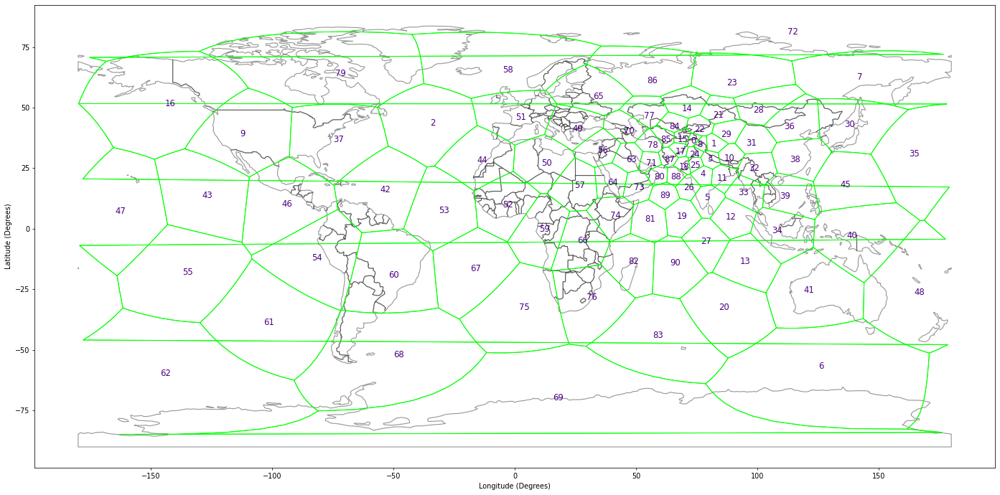

In [50]:
fig, ax = plt.subplots(1,1,figsize = (20,15),sharey=True, dpi=70)
#-- plot continents 
world.plot(ax=ax,alpha=0.4,fc='none',ec='k',linewidth=1.2,rasterized=True)
#-- plot regions
for i,region in enumerate(sv.regions):
    n = len(region)
    t = np.linspace(0,1,10)
    for j in range(n):
        start = sv.vertices[region][j]
        end = sv.vertices[region][(j + 1) % n]
        edge = np.array(geometric_slerp(start, end, t))
        edge_lons,edge_lats = np.ones(len(edge)),np.ones(len(edge))
        for v in range(len(edge)):
            edge_lats[v],edge_lons[v] = pygplates.PointOnSphere(edge[v]).to_lat_lon()
        #-- plot the polygon edges
        ax.plot(edge_lons,edge_lats,color='lime',linewidth=1.)
    cnt_lat,cnt_lon = pygplates.PointOnSphere(sv.points[i]).to_lat_lon()
    if i < 10:
        shift = 1
    elif i < 100:
        shift = 2
    else:
        shift = 3
    ax.text(cnt_lon-shift,cnt_lat-shift,i,fontsize=12,color='indigo')
ax.set_xlabel('Longitude (Degrees)')
ax.set_ylabel('Latitude (Degrees)')
plt.tight_layout()

Double-check that mascons 0 and 8 are the "fixed points" from `spherical_voronoi.ipynb`. Recall the fixed points on the Karakoram had coordinates:
```
lons = np.array([73.57999,76.38069])
lats = np.array([36.29493,34.81469])
```

In [56]:
print('Point 0: ',pygplates.PointOnSphere(sv.points[0]).to_lat_lon())
print('Point 8: ',pygplates.PointOnSphere(sv.points[8]).to_lat_lon())

Point 0:  (36.29493, 73.57999)
Point 8:  (34.814690000000006, 76.38069)


The coordinates match, confirming that our numbering is correct.

Next, we create a spatial grid, rasterize the polygons onto the grid, and convert them to harmonics.

In [5]:
#-- Now we make a grid so we can rasterize the polygons onto a grid
DDEG = 0.25
lons = np.arange(-180,180+DDEG,DDEG)
lats = np.arange(-90,90+DDEG,DDEG)
glat,glon = np.meshgrid(lats,lons)
#-- flatten the grid for easier processing
glon = glon.flatten()
glat = glat.flatten()

In [14]:
#-- set harmonic parameters
LMAX = 60
MMAX = 60
LMIN = 0

In [10]:
#-- read love numbers required for generating geoid harmonics
hl,kl,ll = read_love_numbers(os.path.expanduser('~/read-GRACE-harmonics/gravity_toolkit/data/love_numbers'),REFERENCE='CF')

In [9]:
#-- create Legendre polynomials
th = (90.0 - lats)*np.pi/180.0
plm = plm_mohlenkamp(LMAX, np.cos(th))

Loop through each voronoi region and check if points are within polygon. If an element falls inside the polygon (mascon), we change it's value to 1 cmWE. Otherwise it will be 0 cmWE.

In [10]:
Ylms = {}
for i,region in enumerate(sv.regions):
    #-- intitialize mascon data as all zeros (no mass)
    mass = np.zeros(len(glon))
    #-- get vertices of region
    reg_vert = sv.vertices[region]
    #-- create polygon from vertices on surface of sphere
    poly = pygplates.PolygonOnSphere(reg_vert)
    #-- loop through grid points to identify which lie inside polygon
    for j in range(len(mass)):
        if poly.is_point_in_polygon((glat[j],glon[j])):
            mass[j] = 1
    #-- now convert the mass field to its harmonic representation
    Ylms[i] = gen_stokes(mass.reshape(len(lons),len(lats)),lons,lats,LMIN=LMIN,LMAX=LMAX,UNITS=1,PLM=plm,LOVE=(hl,kl,ll))
    #-- save harmonics to file
    outfile = os.path.join(os.getcwd(),'data','mascon_{0:d}_Ylms_L{1:02d}_{2:.2f}deg.nc'.format(i,LMAX,DDEG))
    ncdf_stokes(np.array(Ylms[i]['clm']),np.array(Ylms[i]['slm']),np.arange(LMAX+1),np.arange(LMAX+1),0,0,FILENAME=outfile,DATE=False)

If you've already saved the harmonics, you can skip the above cell and load the harmonics below:

In [9]:
Ylms = {}
for i,region in enumerate(sv.regions):
    Ylms[i] = ncdf_read_stokes(os.path.join(os.getcwd(),'data','mascon_{0:d}_Ylms_L{1:02d}_{2:.2f}deg.nc'.format(i,LMAX,DDEG)),DATE=False,ATTRIBUTES=False)

In order to double-check the harmonics, convert them back to spatial and plot them with the original polygons.
We construct a new grid for the spatial output. We design this grid to be more coarse for a quick check.

In [23]:
DDEG = 0.5
lons = np.arange(-180,180+DDEG,DDEG)
lats = np.arange(-90,90+DDEG,DDEG)
glat,glon = np.meshgrid(lats,lons)

In [12]:
#-- create Legendre polynomials
th = (90.0 - lats)*np.pi/180.0
plm = plm_mohlenkamp(LMAX, np.cos(th))

In [15]:
#-- convert harmonics to mass unit before spatial conversion
#-- Average Density of the Earth [g/cm^3]
rho_e = 5.517
#-- Average Radius of the Earth [cm]
rad_e = 6.371e8
l = np.arange(0,LMAX+1)
dfactor = rho_e*rad_e*(2.0*l+1.0)/(1.0 +kl[l])/3.0
for m in range(0,MMAX+1):#-- MMAX+1 to include MMAX
    for l in range(m,LMAX+1):#-- LMAX+1 to include LMAX
        plm[l,m,:] = plm[l,m,:]*dfactor[l]

In [51]:
#--Plot out mascons in spatial domain coverted back from harmonics for each region
sp = {}
for i in [0,8,41,37]:
    sp[i] = harmonic_summation(Ylms[i]['clm'],Ylms[i]['slm'],lons,lats,LMAX=LMAX,MMAX=MMAX,PLM=plm)

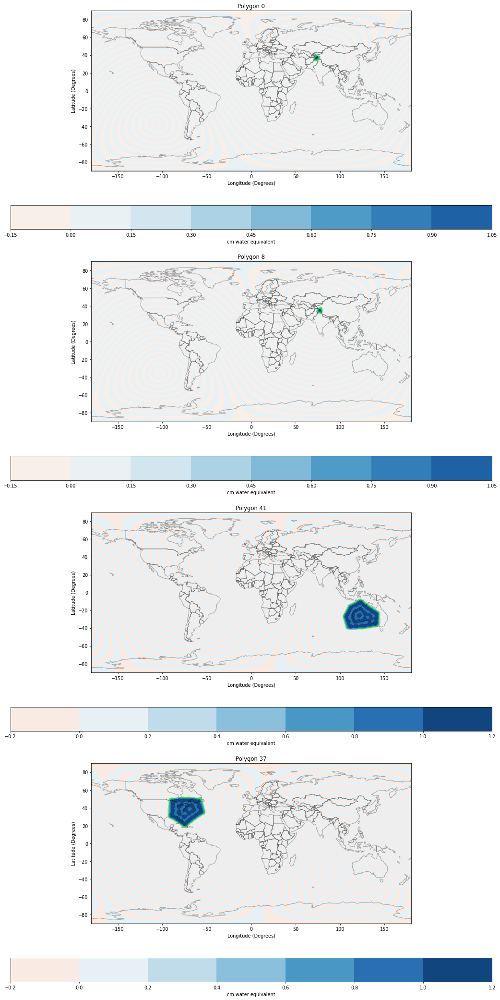

In [52]:
fig, ax = plt.subplots(len(sp),1,figsize = (15,30),sharey=True, dpi=70)
for i,k in enumerate(sp.keys()):
    p = ax[i].contourf(glon,glat,sp[k],cmap='RdBu',vmin=-1.2,vmax=1.2)
    cbar = fig.colorbar(p,orientation='horizontal',ax=ax[i])
    cbar.set_label('cm water equivalent')
    #-- plot continents 
    world.plot(ax=ax[i],alpha=0.3,fc='none',ec='k',linewidth=1.2,rasterized=True)
    #-- also plot the origina polygon
    region = sv.regions[k]
    n = len(region)
    t = np.linspace(0,1,10)
    for j in range(n):
        start = sv.vertices[region][j]
        end = sv.vertices[region][(j + 1) % n]
        edge = np.array(geometric_slerp(start, end, t))
        edge_lons,edge_lats = np.ones(len(edge)),np.ones(len(edge))
        for v in range(len(edge)):
            edge_lats[v],edge_lons[v] = pygplates.PointOnSphere(edge[v]).to_lat_lon()
        #-- plot the polygon edges
        ax[i].plot(edge_lons,edge_lats,color='lime',linewidth=1.2)
    ax[i].set_xlabel('Longitude (Degrees)')
    ax[i].set_title('Polygon {0:d}'.format(k))
    ax[i].set_ylabel('Latitude (Degrees)')
plt.tight_layout()

The harmonics and the original polygons are aligned, confirming the results.

# TODO
- calculate and plot the sensitivity kernels of the mascons corresponding to the fixed point in `spherical_voronoi.ipynb`